In [1]:
# Import packages and libraries

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
#import plotly.express as px
#import geopandas as gpd

from datetime import date
from datetime import datetime


from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from xgboost import XGBClassifier
from xgboost import plot_importance

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score
from sklearn.metrics import roc_curve, roc_auc_score

import pickle
import math

import statsmodels.api as sm
from scipy import stats


In [2]:
# This lets us see all of the columns, preventing Juptyer from redacting them.
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/nyc-taxi-gratuity-prediction-analyze/'

import warnings
warnings.filterwarnings('ignore')

### **Imports and data loading**

**Dataframe in this lab**
* df_credit: credit card subset from df_clean joint crime data
* df_sample: drop unnecessary features from df_credit
* df_dummy: df_subset with dummy encoding
* df_label: df_subset with label encoding

In [3]:
# Load dataset into dataframe
df_credit = pd.read_csv(input_file_path+'nyc_clean_credit_trips.csv',keep_default_na=True)


In [4]:
df_credit.info()

df_credit.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 124 entries, ID to PUDO_LocationID
dtypes: bool(6), float64(60), int64(34), object(24)
memory usage: 13.5+ MB


,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit4,mean_distance_unit4,mean_duration_unit4,mean_speed_unit4,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,PU_DO_Location,PU_DO_zone,PUDO_LocationID
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231_am_rush,3.340000,14.067000,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75,1,0,1,0,1965.0,0.204580,402.0,0.535878,1053.0,0.351145,690.0,0.184733,363.0,1987.0,0.211374,420.0,0.428284,851.0,0.358329,712.0,0.069955,139.0,100_231,Garment District_TriBeCa/Civic Center,100_231
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43_daytime,3.095000,23.283250,8.296162,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00,1,0,1,0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0,631.0,0.335975,212.0,0.353407,223.0,0.534073,337.0,-0.180666,-114.0,186_43,Penn Station/Madison Sq West_Central Park,186_43
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,Fal

### Define common variable

In [5]:
#define valid RatecodeID
RateCodeIDList=[1,2,3,4,5,6]

#define valid PULocationID and DOLocationID(exclude 264 Unknown)
LocationIDList=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 265]

#define locationid list without JFK airport, Newark airport, Unknown, Outside of NYC
LocationID_InsideNYC_Standard=[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263]

#taxi zone LocationID of JFK airport
CONST_JFK_LocationID=132

#taxi zone LocationID of LaGuardia Airport
CONST_LaGuardia_LocationID=138

#taxi zone LocationID of Newark airport
CONST_Newark_LocationID=1

#taxi zone LocationID of Unknown
CONST_Unknown_LocationID=264


#Outside of NYC
CONST_Outside_NYC_LocationID=265


#Max work time
MAX_WORK_TIME_MINUTES=720

#Max speed 
MAX_SPEED=70

#rush hour surcharge for Standard Metered Fare
CONST_RUSH_HOUR_SURCHARGE_STANDARD=1

#rush hour surcharge for Manhattan<->JFK
CONST_RUSH_HOUR_SURCHARGE_JFK=4.5

#night time surcharge
CONST_NIGHT_TIME_SURCHARGE=0.5

#standard unit fare: $.50 per One-fifth of a mile 
#or $.50 per minute(60 seconds) traveling at less than 12 miles an hour
STANDARD_UNIT_FARE=0.5

#Standard Metered Fare initial charge
STANDARD_INITIAL_CHARGE=2.5

#define payment type that passenger could use
#1= Credit card 
#2= Cash 
Passenger_Payment=[1,2]




########################################
# Order
########################################
Weekday_Order = ["Sunday","Monday", "Tuesday", "Wednesday", "Thursday", "Friday","Saturday"]


########################################
# Visualization
########################################
#Singal bar color
BAR_COLOR_BLUE='#1f77b4'

In [6]:
######################################################
#fill crime ratio/count out of nyc with -1
######################################################
target_columns=['total_count_PU', 'Violence_Ratio_PU',
       'Violence_Cnt_PU', 'Larceny_Ratio_PU', 'Larceny_Cnt_PU',
       'ViolenceRalated_Ratio_PU', 'ViolenceRalated_Cnt_PU', 'diff_Ratio_PU',
       'diff_Cnt_PU', 'total_count_DO', 'Violence_Ratio_DO', 'Violence_Cnt_DO',
       'Larceny_Ratio_DO', 'Larceny_Cnt_DO', 'ViolenceRalated_Ratio_DO',
       'ViolenceRalated_Cnt_DO', 'diff_Ratio_DO', 'diff_Cnt_DO']
df_credit.loc[:,target_columns]=df_credit[target_columns].fillna(value=-1,method=None)
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 124 entries, ID to PUDO_LocationID
dtypes: bool(6), float64(60), int64(34), object(24)
memory usage: 13.5+ MB


In [7]:
###########################################
#Transform Weekday Name columns
###########################################
df_credit['PU_weekday'] = pd.Categorical(df_credit['PU_weekday'], categories=Weekday_Order, ordered=True)
df_credit['PU_weekday'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 14883 entries, 0 to 14882
Series name: PU_weekday
Non-Null Count  Dtype   
--------------  -----   
14883 non-null  category
dtypes: category(1)
memory usage: 15.0 KB


In [8]:
##################################################
#Check missing values
##################################################
if pd.isna(df_credit).any(axis=1).sum()>0:
    raise Exception("Missing value")

In [9]:
df_credit['tip_percent']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),1)
df_credit['tip_percent_int']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),0)
df_credit['tip_percent_int']=df_credit['tip_percent_int'].astype(int)

df_credit['total_fare']=round(df_credit['total_amount']-df_credit['tip_amount'],3)
df_credit['cal_tip']=round(df_credit['total_fare']*df_credit['tip_percent_int']*0.01,3)
df_credit['tip_diff']=round(df_credit['cal_tip']-df_credit['tip_amount'],3)
df_credit['total_fare_diff']=round(df_credit['total_fare']-(df_credit['tip_amount']*100/df_credit['tip_percent_int']),3)
#since some trips tip_percent_int=0
df_credit['total_fare_diff']=df_credit['total_fare_diff'].fillna(0)

df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 124 entries, ID to PUDO_LocationID
dtypes: bool(6), category(1), float64(60), int64(34), object(23)
memory usage: 13.4+ MB


### Feature selection

In [10]:
#add VendorID(to confirm importance of this feature when not consider vendor calculation logic differences)
#add from the end
target_columns=['generous', 'not_generous',
                'Generous_by_tippercent', 'NGenerous_by_tippercent',
                'PULocationID', 'DOLocationID','RatecodeID',
                'mean_trip_distance','mean_trip_duration','mean_trip_speed','predict_fare_amount',
                'PU_month','PU_season','PU_weekday', 'holiday',
                'PU_hour_class','PU_hour',
                'VendorID',
                'total_count_PU','total_count_DO','within_nyc',
                'Violence_Ratio_PU','Violence_Cnt_PU','Larceny_Ratio_PU','Larceny_Cnt_PU',
                'Violence_Ratio_DO','Violence_Cnt_DO','Larceny_Ratio_DO','Larceny_Cnt_DO',
                'ViolenceRalated_Ratio_PU','ViolenceRalated_Cnt_PU','diff_Ratio_PU','diff_Cnt_PU',
                'ViolenceRalated_Ratio_DO','ViolenceRalated_Cnt_DO','diff_Ratio_DO','diff_Cnt_DO',
               ]
df_sample=df_credit[target_columns]

In [11]:
#encode holiday
holiday_map={
    True: 1,
    False: 0
}
df_sample['holiday']=df_sample['holiday'].map(holiday_map)

#encode RatecodeID
ratecodeid_map={
    1:'Standard_rate',
    2:'JFK',
    3:'Newark',
    4:'Nassau_or_Westchester',
    5:'Negotiated_fare',
    6:'Group_ride'
}
df_sample['RatecodeID_str']=df_sample['RatecodeID']
df_sample['RatecodeID_str']=df_sample['RatecodeID_str'].map(ratecodeid_map)
df_sample=pd.get_dummies(df_sample,columns=['RatecodeID_str'], prefix_sep='_', dtype=bool, prefix=None)

df_sample.head()

,generous,not_generous,Generous_by_tippercent,NGenerous_by_tippercent,PULocationID,DOLocationID,RatecodeID,mean_trip_distance,mean_trip_duration,mean_trip_speed,predict_fare_amount,PU_month,PU_season,PU_weekday,holiday,PU_hour_class,PU_hour,VendorID,total_count_PU,total_count_DO,within_nyc,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,RatecodeID_str_JFK,RatecodeID_str_Nassau_or_Westchester,RatecodeID_str_Negotiated_fare,RatecodeID_str_Newark,RatecodeID_str_Standard_rate
0,1,0,1,0,100,231,1,3.340000,14.067000,14.246445,13.010263,3,spring,Saturday,1,am_rush,8,2,1965.0,1987.0,True,0.204580,402.0,0.535878,1053.0,0.211374,420.0,0.428284,851.0,0.351145,690.0,0.184733,363.0,0.358329,712.0,0.069955,139.0,False,False,False,False,True
1,1,0,1,0,186,43,1,3.095000,23.283250,8.296162,16.265126,4,spring,Tuesday,0,daytime,14,1,2256.0,631.0,True,0.143617,324.0,0.731383,1650.0,0.335975,212.0,0.353407,223.0,0.210993,476.0,0.520390,1174.0,0.534073,337.0,-0.180666,-114.0,False,False,False,False,True
2,1,0,0,1,262,236,1,0.875714,6.407286,8.848934,6.116305,12,winter,Friday,0,am_rush,7,1,617.0,1254.0,True,0.291734,180.0,0.419773,259.0,0.179426,225.0,0.649920,815.0,0.452188,279.0,-0.032415,-20.0,0.251994,316.0,0.397927,499.0,False,False,False,False,True
3,1,0,1,0,188,97,1,3.700000,30.250000,7.338843,19.392487,5,spring,Sunday,1,daytime,13,2,4206.0,2288.0,True,0.373990,1573.0,0.276510,1163.0,0.307692,704.0,0.394231,902.0,0.597004,2511.0,-0.320495,-1348.0,0.521853,1194.0,-0.127622,-292.0,False,False,False,False,True
4,1,0,1,0,161,236,1,2.195000,8.908250,15.626526,9.225913,3,spring,Saturday,1,nighttime,20,2,1583.0,1254.0,True,0.162350,257.0,0.674668,1068.0,0.179426,225.0,0.649920,815.0,0.258370,409.0,0.416298,659.0,0.251994,316.0,0.397927,499.0,False,False,False,False,True


### Build Models

#### Dummy encoding

In [12]:
######################################################
#Dummy encoding
######################################################
# 1. Define list of cols to convert to string
df_dummy=df_sample.copy()
cols_to_str=['RatecodeID','PULocationID','DOLocationID','PU_month','PU_hour']

# 2. Convert each column to string
for col in cols_to_str:
    df_dummy[col]=df_dummy[col].astype(str)

#confirm after update
df_dummy.info()

#**************************#
#Confirm column names
#**************************#
#check object type and see if any object columns+'_' exists in other columns(e.g. RatecodeID and RatecodeID_XXXX NG)
#get columns which could be convert into dummy/indicator variables
trans_dummy_variables=list(df_dummy.select_dtypes(include=[object,'category']).columns)

#get columns which could not be convert into dummy/indicator variables
not_trans_dummy_variables=list(df_dummy.select_dtypes(exclude=[object,'category']).columns)

#after dummy encoding, their column name would be XXXX->XXXX_YYYY1,XXXX_YYYY2....
#get_fit_features will not work correctly if both XXXX and XXXX_?(Not columns after dummy encoding)(? means any word) exist
#e.g. RatecodeID and RatecodeID_good, RatecodeID_others will be NG
#RatecodeID and RatecodeIDA_good, Ratecode_BBB will be OK
if len(trans_dummy_variables)+len(not_trans_dummy_variables)!=len(df_dummy.columns):
    raise Exception("Data type incorrect, please check again")
if not (set(trans_dummy_variables).union(set(not_trans_dummy_variables))==set(df_dummy.columns)):
    raise Exception("Data type incorrect, please check again")
print(trans_dummy_variables)
dummy_prefix_sep='_dummy_'
duplicate_flg=False

for dummy_col in trans_dummy_variables:
    for not_trans_col in not_trans_dummy_variables:
        if (dummy_col+dummy_prefix_sep) in not_trans_col:
            duplicate_flg=True
if duplicate_flg==True:
    raise Exception("Dummy variable columns duplicated with others, please update column names")



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   generous                              14883 non-null  int64   
 1   not_generous                          14883 non-null  int64   
 2   Generous_by_tippercent                14883 non-null  int64   
 3   NGenerous_by_tippercent               14883 non-null  int64   
 4   PULocationID                          14883 non-null  object  
 5   DOLocationID                          14883 non-null  object  
 6   RatecodeID                            14883 non-null  object  
 7   mean_trip_distance                    14883 non-null  float64 
 8   mean_trip_duration                    14883 non-null  float64 
 9   mean_trip_speed                       14883 non-null  float64 
 10  predict_fare_amount                   14883 non-null  float64 
 11  PU

In [13]:
# Convert categoricals to binary
df_dummy=pd.get_dummies(df_dummy,columns=['PULocationID', 'DOLocationID', 'RatecodeID', 'PU_month', 'PU_season', 'PU_weekday', 'PU_hour_class', 'PU_hour'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 390 entries, generous to PU_hour_dummy_9
dtypes: bool(362), float64(22), int64(6)
memory usage: 8.3 MB


#### Label encoding

In [14]:
######################################################
#Label encoding
######################################################
df_label=df_sample.copy()

#******************************#
#label encoding
#******************************#
#encoding PU_season
season_map={
    "spring": 0,
    "summer": 1,
    "autumn": 2,
    "winter": 3,
}
hour_class_map={
    'nighttime':0,
    'am_rush':1,
    'pm_rush':2,
    'daytime':3,
}

df_label['PU_season']=df_label['PU_season'].map(season_map)
df_label['PU_hour_class']=df_label['PU_hour_class'].map(hour_class_map)
df_label['PU_weekday']=df_label['PU_weekday'].cat.codes
#confirm after update
df_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   generous                              14883 non-null  int64  
 1   not_generous                          14883 non-null  int64  
 2   Generous_by_tippercent                14883 non-null  int64  
 3   NGenerous_by_tippercent               14883 non-null  int64  
 4   PULocationID                          14883 non-null  int64  
 5   DOLocationID                          14883 non-null  int64  
 6   RatecodeID                            14883 non-null  int64  
 7   mean_trip_distance                    14883 non-null  float64
 8   mean_trip_duration                    14883 non-null  float64
 9   mean_trip_speed                       14883 non-null  float64
 10  predict_fare_amount                   14883 non-null  float64
 11  PU_month       

##### Evaluation metric

**generous or Generous_by_tippercent**
* False positives (the model predicts a tip ≥ 20%, but the customer does not give one), drivers may feel dissatisfacied or frustrating
* False negatives (the model predicts a tip < 20%, but the customer gives more), drivers may reject passengers or provide poor service, passengers will feel dissatisfacied

In this case need to weigh both precision and recall equally, use **f1** as evaluation metric

In [15]:
#confirm proportion of generous passengers(consider tip amount calculation difference between vendors)
display(df_dummy['generous'].value_counts(normalize=True))

#confirm proportion of not generous passengers(Just compare, will not use)
display(df_dummy['not_generous'].value_counts(normalize=True))

#confirm proportion of generous passengers(not consider tip amount calculation difference between vendors)
display(df_dummy['Generous_by_tippercent'].value_counts(normalize=True))

#confirm proportion of not generous passengers(Just compare, will not use)
display(df_dummy['NGenerous_by_tippercent'].value_counts(normalize=True))

generous
1    0.696701
0    0.303299
Name: proportion, dtype: float64

not_generous
0    0.696701
1    0.303299
Name: proportion, dtype: float64

Generous_by_tippercent
1    0.528254
0    0.471746
Name: proportion, dtype: float64

NGenerous_by_tippercent
0    0.528254
1    0.471746
Name: proportion, dtype: float64

* When consider tip amount calculation difference between vendors, the proportion of generous passengers was 0.7, imbalanced.
* When not consider tip amount calculation difference between vendors, the proportion of generous passengers was 0.53, almost balanced.

### Split data into train, val, test

Use train set to train models<BR/>
Use val set to evaluate and select champion model<BR/>
Use test set to test champion model<BR/>

|Dependent variable|Description|
|:-               |:-         |
|generous|1:customer tipped(tip_amount) ≥ total_fare*20%(round to .01 or .05)<BR/> 0: otherwise|
|not_generous|1:customer tipped(tip_amount) < total_fare*20%(round to .01 or .05)<BR/>0:otherwise|
|Generous_by_tippercent|1:customer tipped(tip_percent) ≥ 20%<BR/>0:customer tipped(tip_percent) < 20%|
|NGenerous_by_tippercent|1:customer tipped(tip_percent) < 20%<BR/>0:customer tipped(tip_percent) ≥ 20%|

* total_fare=total_amount-tip_amount
* tip_percent=tip_amount/total_fare

In [16]:
RANDOM_STATE=0
depedent_variables=['generous','not_generous','Generous_by_tippercent','NGenerous_by_tippercent']
################################################
#Use dummy encoding dataset
################################################
y_dummy_list=[]
for depedent_var in depedent_variables:
    y_dummy=df_dummy[depedent_var]
    y_dummy_list.append(y_dummy)

X_dummy = df_dummy.copy()
X_dummy = X_dummy.drop(depedent_variables, axis = 1)


#*****************************************#
# Split into train and test sets
#*****************************************#
X_dummy_train_val_list=[]
y_dummy_train_val_list=[]
X_dummy_test_list=[]
y_dummy_test_list=[]
X_dummy_train_list=[]
y_dummy_train_list=[]
X_dummy_val_list=[]
y_dummy_val_list=[]

for y_dummy in y_dummy_list:
    X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                        test_size=0.25, stratify=y_dummy, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                      test_size=0.2, stratify=y_dummy_train_val, 
                                                      random_state=RANDOM_STATE)
    X_dummy_train_val_list.append(X_dummy_train_val)
    y_dummy_train_val_list.append(y_dummy_train_val)
    X_dummy_test_list.append(X_dummy_test)
    y_dummy_test_list.append(y_dummy_test)
    X_dummy_train_list.append(X_dummy_train)
    y_dummy_train_list.append(y_dummy_train)
    X_dummy_val_list.append(X_dummy_val)
    y_dummy_val_list.append(y_dummy_val)

################################################
#Use Label encoding dataset
################################################
y_label_list=[]
for depedent_var in depedent_variables:
    y_label=df_label[depedent_var]
    y_label_list.append(y_label)

X_label = df_label.copy()
X_label = X_label.drop(depedent_variables, axis = 1)

#*****************************************#
# Split into train and test sets
#*****************************************#
X_label_train_val_list=[]
y_label_train_val_list=[]
X_label_test_list=[]
y_label_test_list=[]
X_label_train_list=[]
y_label_train_list=[]
X_label_val_list=[]
y_label_val_list=[]

for y_label in y_label_list:
    X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                        test_size=0.25, stratify=y_label, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                      test_size=0.2, stratify=y_label_train_val, 
                                                      random_state=RANDOM_STATE)
    X_label_train_val_list.append(X_label_train_val)
    y_label_train_val_list.append(y_label_train_val)
    X_label_test_list.append(X_label_test)
    y_label_test_list.append(y_label_test)
    X_label_train_list.append(X_label_train)
    y_label_train_list.append(y_label_train)
    X_label_val_list.append(X_label_val)
    y_label_val_list.append(y_label_val)

In [17]:
df_sample.columns

Index(['generous', 'not_generous', 'Generous_by_tippercent',
       'NGenerous_by_tippercent', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour', 'VendorID', 'total_count_PU',
       'total_count_DO', 'within_nyc', 'Violence_Ratio_PU', 'Violence_Cnt_PU',
       'Larceny_Ratio_PU', 'Larceny_Cnt_PU', 'Violence_Ratio_DO',
       'Violence_Cnt_DO', 'Larceny_Ratio_DO', 'Larceny_Cnt_DO',
       'ViolenceRalated_Ratio_PU', 'ViolenceRalated_Cnt_PU', 'diff_Ratio_PU',
       'diff_Cnt_PU', 'ViolenceRalated_Ratio_DO', 'ViolenceRalated_Cnt_DO',
       'diff_Ratio_DO', 'diff_Cnt_DO', 'RatecodeID_str_JFK',
       'RatecodeID_str_Nassau_or_Westchester',
       'RatecodeID_str_Negotiated_fare', 'RatecodeID_str_Newark',
       'RatecodeID_str_Standard_rate'],
      dtype='object')

In [18]:
# in production environment, it might be difficult to get VendorID or crime data
# and crime data may not be robust(could not get real time data, may depend on police resource, economy, politics, etc)
# For comparison some models contains VendorID or crime data
select_col_list=[
    #Index 1
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 2
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 3
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 4 (add crime count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', ],
    #Index 5 (one-hot encoding RatecodeID)
    ['VendorID', 'PULocationID', 'DOLocationID', 
       'RatecodeID_str_Standard_rate','RatecodeID_str_JFK', 'RatecodeID_str_Nassau_or_Westchester',
       'RatecodeID_str_Negotiated_fare', 'RatecodeID_str_Newark',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', ],
    #Index 6 (within_nyc)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', 'within_nyc',],
    #Index 7 (add crime ratio)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'Violence_Ratio_PU','Larceny_Ratio_PU','Violence_Ratio_DO', 'Larceny_Ratio_DO'],
     #Index 8 (add crime count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'Violence_Cnt_PU','Larceny_Cnt_PU','Violence_Cnt_DO', 'Larceny_Cnt_DO'],
     #Index 9 (add crime ratio and total count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU','Larceny_Ratio_PU',
     'ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO'],
    #Index 10 (add crime diff ratio and total count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','diff_Ratio_PU','diff_Ratio_DO'],
    #Index 11 (index 10 delete VendorID )
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','diff_Ratio_PU','diff_Ratio_DO'],
    #Index 12 (index 9 delete VendorID )
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU','Larceny_Ratio_PU',
     'ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO'],
    #Index 13 
    [  'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 14 (Index2 - 'PULocationID', 'DOLocationID', holiday, PU_season, PU_hour_class)
    [  'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
    #Index 15 
    [  'RatecodeID','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 16 
    [  'RatecodeID','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
     #Index 17 (RatecodeID->within_nyc)
    [  'within_nyc',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 18 (RatecodeID->within_nyc)
    [  'within_nyc',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
    #Index 19 (RatecodeID->within_nyc)
    [  'within_nyc','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 20 (RatecodeID->within_nyc)
    [  'within_nyc','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
]



In [19]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'

path_rf = path+'rf_pickle/'
path_xgb = path+'xgb_pickle/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)

        return model


import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res


def chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep):
    for select_col in select_cols:
        select_col_exist_flg=False
        for dummy_col in dummy_colname_list:
            if select_col in dummy_col:
                select_col_exist_flg=True
            elif (select_col+dummy_prefix_sep) in dummy_col:
                #dummy column
                select_col_exist_flg=True
        if select_col_exist_flg==False:
            raise Exception(f"{select_col} doesn't exist")
            
def chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep):
    select_length=len(select_cols)
    dummy_length=len(dummy_colname_list)
    i=0
    chk_result=False
    while (i < select_length)&(chk_result==False):
        select_col=select_cols[i]
        dummy_jump_flg=False
        select_col_exist_flg=False
        j=0
        while (j<dummy_length)&(dummy_jump_flg==False):
            dummy_col=dummy_colname_list[j]
            if (select_col+dummy_prefix_sep) in dummy_col:
                dummy_jump_flg=True
            j=j+1
        if dummy_jump_flg==True:
            chk_result=True
        i=i+1
    if chk_result==True:
        chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep)
    return chk_result

    
def get_dummy_colnames(select_cols,dummy_colname_list):
    """
    select_cols(list): original columns
    dummy_colname_list(list): column list after dummy encoding
    """
    #separator/delimiter to use in dummy encoding
    dummy_prefix_sep='_dummy_'
    res_dummy_colnames=list(dummy_colname_list)
    #check setting
    if chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep)==False:
        raise Exception("Not dummy encoding")
        
    for dummy_col in dummy_colname_list:
        if dummy_col not in select_cols:
            jump_flg=False
            for col in select_cols:
                if (col+dummy_prefix_sep) in dummy_col:
                    jump_flg=True
            if jump_flg==False:
                res_dummy_colnames.remove(dummy_col) 
    return res_dummy_colnames




def get_fit_features(select_cols, transformed_cols, encoding_type:str,exclude_target_var=True):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        transformed_cols(list): transformed columns(after encoding)
        encoding_type(string): dummy or label encoding type
        exclude_target_var(Bool): exclude target variable or not
    """
    
    #target_variable_list=['generous', 'not_generous']
    target_variable_list=depedent_variables
    label_encoding_drop_list=['day','month']
    valid_encoding=['dummy','label']
    if encoding_type not in valid_encoding:
        raise Exception("Only 'dummy' or 'label' allowed")
    select_features=select_cols.copy()
    if exclude_target_var==True:
        #drop target variables
        for target_var in target_variable_list:
            if target_var in select_features:
                select_features.remove(target_var)

    #if label encoding, drop non-number columns
    if encoding_type=='label':
        for drop_col in label_encoding_drop_list:
            if drop_col in select_features:
                select_features.remove(drop_col)
        for select_feature in select_features:
            if select_feature not in transformed_cols:
                raise Exception("select_cols, transformed_cols ,encoding_type unmatch")
        res_feature_list=select_features
    else:
        res_feature_list=get_dummy_colnames(select_features,transformed_cols)
    return res_feature_list



import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False


def confusion_matrix_plot(model, x_data, y_data,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    plt.title(title)
    plt.show()
    
def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)



def get_regression_scores(model_name:str, preds, y_test_data):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data

    Out:
    table: a pandas df of r2, MSE and MAE scores for your model
    '''
    #f1 = f1_score(y_test_data, preds)
    #compute R-squared
    r_squared=r2_score(y_test_data,preds)
    #compute MSE
    mse=mean_squared_error(y_test_data,preds)
    #compute MAE
    mae=mean_absolute_error(y_test_data,preds)
    table = pd.DataFrame({'model': [model_name],
                        'R-squared': [r_squared],
                        'MSE': [mse],
                        'MAE': [mae],
                        })

    return table

def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data
    preds_prob: numpy array of predicted class probabilities

    Out:
    table: a pandas df of precision, recall, f1, accuracy scores and ROC_AUC for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)
    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        })

    return table

### [Random forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

In [20]:
X_dummy_val.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2233 entries, 8337 to 13662
Columns: 386 entries, mean_trip_distance to PU_hour_dummy_9
dtypes: bool(362), float64(22), int64(2)
memory usage: 1.2 MB


In [21]:
#start from 1
select_index=13
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')
#print(dummy_feature)
print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour', 'total_count_PU', 'total_count_DO', 'ViolenceRalated_Ratio_PU', 'Larceny_Ratio_PU', 'ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,7.615773,4.060443,11.6,17.4,23.2,29.0,40.6,52.2,58,3.741657,2.639057,4.2,7.0,9.8,12.6,14


In [22]:
max_depth=7
train_cnt=X_label.shape[0]

for max_depth in [3,5, 6,7,8,9,11,15]:
    leaf_node_cnt=2**(max_depth)
    avg_leaf_cnt=math.floor(train_cnt/leaf_node_cnt)
    avg_leaf_percent=avg_leaf_cnt/train_cnt
    print(f"Max depth:{max_depth}, Leaf count: {leaf_node_cnt}, avg leaf count: {avg_leaf_cnt}, average leaf node percent: {avg_leaf_percent}")

Max depth:3, Leaf count: 8, avg leaf count: 1860, average leaf node percent: 0.12497480346704294
Max depth:5, Leaf count: 32, avg leaf count: 465, average leaf node percent: 0.031243700866760735
Max depth:6, Leaf count: 64, avg leaf count: 232, average leaf node percent: 0.01558825505610428
Max depth:7, Leaf count: 128, avg leaf count: 116, average leaf node percent: 0.00779412752805214
Max depth:8, Leaf count: 256, avg leaf count: 58, average leaf node percent: 0.00389706376402607
Max depth:9, Leaf count: 512, avg leaf count: 29, average leaf node percent: 0.001948531882013035
Max depth:11, Leaf count: 2048, avg leaf count: 7, average leaf node percent: 0.00047033528186521536
Max depth:15, Leaf count: 32768, avg leaf count: 0, average leaf node percent: 0.0


In [23]:
rf = RandomForestClassifier(random_state=RANDOM_STATE)

cv_dummy_params_list=[
    #index:1
    {'max_depth': [3,7,11,15], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': ["sqrt",0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
     'max_samples': [0.3, 0.5, 0.7, None],
     'n_estimators': [50, 75, 100, 125, 150],
    },
    #index:2
    {'max_depth': [5,6,7,8,9], 
     'min_samples_leaf': [10, 20, 50, 100],
     'min_samples_split': [2],
     'max_features': ["sqrt",0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
     'max_samples': [0.3, 0.5, 0.7],
     'n_estimators': [60, 70, 80, 90,100],
    },
    #index:3 (dummy1&dummy3)
    {'max_depth': [6,7,8,9], 
     'min_samples_leaf': [0.001,0.005,0.007,0.01],
     'min_samples_split': [2],
     'max_features': ["sqrt", 0.2, 0.3, 0.4, 0.5, 0.6,0.7,0.8,0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced'],
    },
    
]


cv_label_params_list=[
    #index:1
    {'max_depth': [3,7,11,15], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1],
     'max_samples': [0.3, 0.5, 0.7, None],
     'n_estimators': [50, 75, 100, 125, 150],
    },
    #index:2
    {'max_depth': [5,6,7,8,9], 
     'min_samples_leaf': [10, 20, 50, 100],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1],
     'max_samples': [0.3, 0.5, 0.7],
     'n_estimators': [60, 70, 80, 90,100],
    },
    #index:3
    {'max_depth': [5,6,7,8,9], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1],
     'max_samples': [0.3, 0.5, 0.7],
     'n_estimators': [60,75,90,105,120],
    },
    #index:4 (label1)
    {'max_depth': [5,7,9], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [50, 75, 100, 125, 150],
     'class_weight':[{0: 1.6, 1:0.7},'balanced_subsample','balanced'],
    },
    #index:5 (label2)
    {'max_depth': [5,7,9], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [50, 75, 100, 125, 150],
     'class_weight':[{0: 0.7, 1:1.6},'balanced_subsample','balanced'],
    },
    #index:6 (label3)
    {'max_depth': [5,7,9], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [50, 75, 100, 125, 150],
     'class_weight':[{0: 1.1, 1:0.9},'balanced_subsample','balanced'],
    },
     #index:7 (label4)
    {'max_depth': [5,7,9], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [50, 75, 100, 125, 150],
     'class_weight':[{0: 0.9, 1:1.1},'balanced_subsample','balanced'],
    },
    #index:8 (label1&label3)
    {'max_depth': [6,7,8,9], 
     'min_samples_leaf': [0.001,0.005,0.007,0.01],
     'min_samples_split': [2],
     'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.9],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 100, 120, 140, 160,180],
     'class_weight':['balanced_subsample','balanced'],
    },
]



In [24]:
total_count=df_sample.shape[0]
#positive_ratio_list=[]
n_classes=2
for dep_var in depedent_variables:
    positive_cnt=df_sample[dep_var].sum()
    negative_cnt=total_count-positive_cnt
    positive_ratio=round(total_count/(positive_cnt*n_classes),1)
    negative_ratio=round(total_count/(negative_cnt*n_classes),1)
    #negative_ratio_list.append(positive_negative_ratio)
    print(dep_var,negative_ratio,positive_ratio)

generous 1.6 0.7
not_generous 0.7 1.6
Generous_by_tippercent 1.1 0.9
NGenerous_by_tippercent 0.9 1.1


In [25]:
import datetime

def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'


def chk_encoding_type(encoding_type):
    valid_encoding=['dummy','label']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'dummy' or 'label' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'dummy' and 'label' two element list are allowed")
    
def rf_grid_fit(target_index:int,feature_index:int, hyp_index:int, gs_index:int, encoding_type:str,rf_classifier, cv=5,refit='f1',score=['accuracy', 'precision', 'recall', 'f1']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            rf_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_rf
    pickle_filenm=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        rf_label_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_label_train[select_feature]).any(axis=0))
        rf_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, rf_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        rf_dummy_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_dummy_train[select_feature]).any(axis=0))
        rf_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, rf_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
               raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=list(encoding_type)
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list

def rf_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    rf_cv_list=[]
    rf_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            rf=read_pickle(path, saved_model_name)
                            rf_model_name_list.append(saved_model_name)
                            rf_cv_list.append(rf)  
    return rf_cv_list,rf_model_name_list

In [26]:
###################################################
#Create Directory for pickle file
###################################################
create_dir(path_rf)
create_dir(path_xgb)

Directory '/kaggle/working/rf_pickle/' created successfully.
Directory '/kaggle/working/xgb_pickle/' created successfully.


In [27]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################

import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/'
destination = path_rf

# gather all files
allfiles = glob.glob(os.path.join(source, 'rf_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/rf_label4_cv3_hyp3_gs1.pickle -> /kaggle/working/rf_pickle/rf_label4_cv3_hyp3_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/rf_dummy3_cv1_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy3_cv1_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/rf_label2_cv2_hyp5_gs2.pickle -> /kaggle/working/rf_pickle/rf_label2_cv2_hyp5_gs2.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/rf_dummy4_cv1_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy4_cv1_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/randomforest/rf_pickle/rf_label1_cv2_hyp2_gs1.pickle -> /kaggle/working/rf_pickle/rf_label1_cv2_hyp2_gs1.pi

In [28]:
#target_index=2
#start from 1
#feature_index=1
#hyparameter index,start from 1
#hyp_index=1
#GridSearchCV index,start from 1
#gs_index=1
#rf_grid_fit(target_index,feature_index, hyp_index, gs_index, encoding_type='dummy', rf_classifier=rf,cv=2, refit='f1')

In [29]:
####################################################
#target_index:[1]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1,2,3]
#encoding:dummy & label
#cv:3,5,7
####################################################
#target_index_list=[1]
#feature_index_list=[1]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=3, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', rf_classifier=rf,cv=7, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=3, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', rf_classifier=rf,cv=7, refit='f1')

In [30]:
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
####################################################
#target_index_list=[2]
#feature_index_list=[1]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

In [31]:
####################################################
#target_index:[3,4]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
####################################################
#target_index_list=[3,4]
#feature_index_list=[1]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

In [32]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[2]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

In [33]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[1,2]
#hyparameter index: [2]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[1,2]
#hyparameter index,start from 1
#hyp_index_list=[2]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

In [34]:
#rf_grid_fit(target_index=4,feature_index=1, hyp_index=2, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

In [35]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[3]
#hyparameter index: [3]
#GridSearchCV index: [1]
#encoding:label
#cv:5
#confirm VendorID effect
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[3]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#=>target index 3 and 4 result changed, could change threshold and tune parameters

In [36]:
####################################################
#target_index:[3,4]
#feature_index:[3]
#hyparameter index: [3]
#GridSearchCV index: [1]
#encoding:label
#cv:5
#tune parameter for feature 3
####################################################
#target_index_list=[3,4]
#feature_index_list=[3]
#hyparameter index,start from 1
#hyp_index_list=[3]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#=>no big change

In [37]:
####################################################
#target_index:[1]
#feature_index:[10]
#hyparameter index: [4]
#GridSearchCV index: [1]
#encoding:label
#cv:5
#tune parameter for feature 10
####################################################
#target_index_list=[1]
#feature_index_list=[10]
#hyparameter index,start from 1
#hyp_index_list=[4]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='precision')
#            rf_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', rf_classifier=rf, cv=5, refit=True,score='roc_auc')


In [38]:
####################################################
#target_index:[1]
#feature_index:[2,11,12]
#hyparameter index: [4]
#GridSearchCV index: [1,2]
#encoding:label
#cv:5
####################################################
#target_index_list=[1]
#feature_index_list=[2,11,12]
#hyparameter index,start from 1
#hyp_index_list=[4]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf, cv=5, refit=True,score='roc_auc')


In [39]:
####################################################
#target_index:[3]
#feature_index:[3,9,10]
#hyparameter index: [6]
#GridSearchCV index: [1,2]
#encoding:label
#cv:5
####################################################
#target_index_list=[3]
#feature_index_list=[3,9,10]
#hyparameter index,start from 1
#hyp_index_list=[6]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf, cv=5, refit=True,score='roc_auc')


In [40]:
## already fit
# not fit

##rf_grid_fit(target_index=1,feature_index=13, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=1,feature_index=13, hyp_index=3, gs_index=1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=1,feature_index=14, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

##rf_grid_fit(target_index=1,feature_index=18, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

##rf_grid_fit(target_index=1,feature_index=14, hyp_index=3, gs_index=1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')

In [41]:
##rf_grid_fit(target_index=3,feature_index=14, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=3,feature_index=16, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=3,feature_index=18, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=3,feature_index=20, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=3,feature_index=13, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
##rf_grid_fit(target_index=3,feature_index=15, hyp_index=8, gs_index=1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')


#rf_grid_fit(target_index=3,feature_index=13, hyp_index=3, gs_index=1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
#rf_grid_fit(target_index=3,feature_index=14, hyp_index=3, gs_index=1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')


**pickle file**

| File                   | Variables Used | Target Variable         | Hyperparameters |cv |refit|
| :-                     | :-             | :-                      |:-               |-: |:-   |
| rf_dummy1_cv1_hyp1_gs1 | select_col1    | generous                |cv_dummy_params1 |5  |f1   |
| rf_dummy1_cv1_hyp1_gs2 | select_col1    | generous                |cv_dummy_params1 |3  |f1   |
| rf_dummy1_cv1_hyp1_gs3 | select_col1    | generous                |cv_dummy_params1 |7  |f1   |
| rf_dummy1_cv1_hyp2_gs1 | select_col1    | generous                |cv_dummy_params2 |5  |f1   |
| rf_dummy1_cv2_hyp1_gs1 | select_col2    | generous                |cv_dummy_params1 |5  |f1   |
| rf_dummy1_cv2_hyp2_gs1 | select_col2    | generous                |cv_dummy_params2 |5  |f1   |
| rf_dummy1_cv13_hyp3_gs1| select_col13   | generous                |cv_dummy_params3 |5  |f1   |
| rf_dummy1_cv14_hyp3_gs1| select_col14   | generous                |cv_dummy_params3 |5  |f1   |
| rf_label1_cv1_hyp1_gs1 | select_col1    | generous                |cv_label_params1 |5  |f1   |
| rf_label1_cv1_hyp1_gs2 | select_col1    | generous                |cv_label_params1 |3  |f1   |
| rf_label1_cv1_hyp1_gs3 | select_col1    | generous                |cv_label_params1 |7  |f1   |
| rf_label1_cv1_hyp2_gs1 | select_col1    | generous                |cv_label_params2 |5  |f1   |
| rf_label1_cv1_hyp4_gs1 | select_col1    | generous                |cv_label_params4 |5  |f1   |
| rf_label1_cv1_hyp4_gs2 | select_col1    | generous                |cv_label_params4 |5 |roc_auc|
| rf_label1_cv3_hyp1_gs1 | select_col3    | generous                |cv_label_params1 |5  |f1   |
| rf_label1_cv10_hyp4_gs1| select_col10   | generous                |cv_label_params4 |5  |f1   |
| rf_label1_cv10_hyp4_gs2| select_col10   | generous                |cv_label_params4 |5  |precision|
| rf_label1_cv10_hyp4_gs3| select_col10   | generous                |cv_label_params4 |5  |roc_auc|
| rf_label1_cv11_hyp4_gs1| select_col11   | generous                |cv_label_params4 |5  |f1   |
| rf_label1_cv11_hyp4_gs2| select_col11   | generous                |cv_label_params4 |5  |roc_auc|
| rf_label1_cv12_hyp4_gs1| select_col12   | generous                |cv_label_params4 |5  |f1   |
| rf_label1_cv12_hyp4_gs2| select_col12   | generous                |cv_label_params4 |5  |roc_auc|
| rf_label1_cv13_hyp8_gs1| select_col13   | generous                |cv_label_params8 |5  |f1   |
| rf_label1_cv14_hyp8_gs1| select_col14   | generous                |cv_label_params8 |5  |f1   |
| rf_label1_cv18_hyp8_gs1| select_col18   | generous                |cv_label_params8 |5  |f1   |
| rf_dummy2_cv1_hyp1_gs1 | select_col1    | not_generous            |cv_dummy_params1 |5  |f1   |
| rf_dummy2_cv1_hyp2_gs1 | select_col1    | not_generous            |cv_dummy_params2 |5  |f1   |
| rf_dummy2_cv2_hyp1_gs1 | select_col2    | not_generous            |cv_dummy_params1 |5  |f1   |
| rf_dummy2_cv2_hyp2_gs1 | select_col2    | not_generous            |cv_dummy_params2 |5  |f1   |
| rf_label2_cv1_hyp1_gs1 | select_col1    | not_generous            |cv_label_params1 |5  |f1   |
| rf_label2_cv1_hyp2_gs1 | select_col1    | not_generous            |cv_label_params2 |5  |f1   |
| rf_label2_cv2_hyp1_gs1 | select_col2    | not_generous            |cv_label_params1 |5  |f1   |
| rf_label2_cv2_hyp2_gs1 | select_col2    | not_generous            |cv_label_params2 |5  |f1   |
| rf_label2_cv2_hyp5_gs1 | select_col2    | not_generous            |cv_label_params5 |5  |f1   |
| rf_label2_cv2_hyp5_gs2 | select_col2    | not_generous            |cv_label_params5 |5  |roc_auc|
| rf_label2_cv3_hyp1_gs1 | select_col3    | not_generous            |cv_label_params1 |5  |f1   |
| rf_label2_cv11_hyp5_gs1| select_col11   | not_generous            |cv_label_params5 |5  |f1   |
| rf_label2_cv11_hyp5_gs2| select_col11   | not_generous            |cv_label_params5 |5  |roc_auc|
| rf_dummy3_cv1_hyp1_gs1 | select_col1    | Generous_by_tippercent  |cv_dummy_params1 |5  |f1   |
| rf_dummy3_cv1_hyp2_gs1 | select_col1    | Generous_by_tippercent  |cv_dummy_params2 |5  |f1   |
| rf_dummy3_cv2_hyp1_gs1 | select_col2    | Generous_by_tippercent  |cv_dummy_params1 |5  |f1   |
| rf_dummy3_cv2_hyp2_gs1 | select_col2    | Generous_by_tippercent  |cv_dummy_params2 |5  |f1   |
| rf_label3_cv1_hyp1_gs1 | select_col1    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| rf_label3_cv1_hyp2_gs1 | select_col1    | Generous_by_tippercent  |cv_label_params2 |5  |f1   |
| rf_label3_cv2_hyp1_gs1 | select_col2    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| rf_label3_cv3_hyp1_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| rf_label3_cv3_hyp3_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params3 |5  |f1   |
| rf_label3_cv3_hyp6_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params6 |5  |f1   |
| rf_label3_cv3_hyp6_gs2 | select_col3    | Generous_by_tippercent  |cv_label_params6 |5  |roc_auc|
| rf_label3_cv9_hyp6_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| rf_label3_cv9_hyp6_gs2 | select_col3    | Generous_by_tippercent  |cv_label_params9 |5  |roc_auc|
| rf_label3_cv10_hyp6_gs1| select_col3    | Generous_by_tippercent  |cv_label_params10|5  |f1   |
| rf_label3_cv10_hyp6_gs2| select_col3    | Generous_by_tippercent  |cv_label_params10|5  |roc_auc|
| rf_label3_cv13_hyp8_gs1| select_col13   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_label3_cv14_hyp8_gs1| select_col14   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_label3_cv15_hyp8_gs1| select_col15   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_label3_cv16_hyp8_gs1| select_col16   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_label3_cv18_hyp8_gs1| select_col18   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_label3_cv20_hyp8_gs1| select_col20   | Generous_by_tippercent  |cv_label_params8 |5  |f1   |
| rf_dummy4_cv1_hyp1_gs1 | select_col1    | NGenerous_by_tippercent |cv_dummy_params1 |5  |f1   |
| rf_dummy4_cv1_hyp2_gs1 | select_col1    | NGenerous_by_tippercent |cv_dummy_params2 |5  |f1   |
| rf_dummy4_cv2_hyp1_gs1 | select_col2    | NGenerous_by_tippercent |cv_dummy_params1 |5  |f1   |
| rf_label4_cv1_hyp1_gs1 | select_col1    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| rf_label4_cv1_hyp2_gs1 | select_col1    | NGenerous_by_tippercent |cv_label_params2 |5  |f1   |
| rf_label4_cv2_hyp1_gs1 | select_col2    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| rf_label4_cv3_hyp1_gs1 | select_col3    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| rf_label4_cv3_hyp3_gs1 | select_col3    | NGenerous_by_tippercent |cv_label_params3 |5  |f1   |


In [42]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
target_len=len(depedent_variables)
feature_len=len(select_col_list)
hyp_len=max(len(cv_label_params_list),len(cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
rf_cv_list,rf_model_name_list=rf_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_rf)

In [43]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
rf_best_hyperparameters=pd.DataFrame()
for index in range(len(rf_cv_list)):
    rf_row=rf_cv_list[index].best_params_
    rf_row['RF Model name']=rf_model_name_list[index]
    df_dictionary = pd.DataFrame([rf_row])
    rf_best_hyperparameters = pd.concat([rf_best_hyperparameters, df_dictionary], ignore_index=True)

rf_best_hyperparameters.to_csv('rf_best_hyperparameters.csv', index=False)
rf_best_hyperparameters

,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name,class_weight
0,11,0.1,0.3,1.0,2,75,rf_dummy1_cv1_hyp1_gs1,NaN
1,15,0.2,0.3,1.0,2,100,rf_dummy1_cv1_hyp1_gs2,NaN
2,3,sqrt,0.3,1.0,2,50,rf_dummy1_cv1_hyp1_gs3,NaN
3,5,sqrt,0.3,10.0,2,60,rf_dummy1_cv1_hyp2_gs1,NaN
4,7,0.3,0.3,1.0,2,100,rf_label1_cv1_hyp1_gs1,NaN
...,...,...,...,...,...,...,...,...
63,9,0.9,0.7,10.0,2,80,rf_label4_cv1_hyp2_gs1,NaN
64,15,0.2,0.3,1.0,2,75,rf_dummy4_cv2_hyp1_gs1,NaN
65,15,0.7,0.5,1.0,2,100,rf_label4_cv2_hyp1_gs1,NaN
66,11,0.5,NaN,1.0,2,50,rf_label4_cv3_hyp1_gs1,NaN


In [44]:
#Confirm hyperparameters of generous
#Consider tip amount calculation difference between two vendors
rf_best_hyperparameters[rf_best_hyperparameters['RF Model name'].str.contains('label1|dummy1')]

,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name,class_weight
0,11,0.1,0.3,1.000,2,75,rf_dummy1_cv1_hyp1_gs1,NaN
1,15,0.2,0.3,1.000,2,100,rf_dummy1_cv1_hyp1_gs2,NaN
2,3,sqrt,0.3,1.000,2,50,rf_dummy1_cv1_hyp1_gs3,NaN
3,5,sqrt,0.3,10.000,2,60,rf_dummy1_cv1_hyp2_gs1,NaN
4,7,0.3,0.3,1.000,2,100,rf_label1_cv1_hyp1_gs1,NaN
5,3,0.9,NaN,1.000,2,75,rf_label1_cv1_hyp1_gs2,NaN
6,7,1,0.3,1.000,2,50,rf_label1_cv1_hyp1_gs3,NaN
7,8,0.9,0.5,10.000,2,80,rf_label1_cv1_hyp2_gs1,NaN
8,7,0.5,0.3,1.000,2,75,rf_dummy1_cv2_hyp1_gs1,NaN
9,5,0.6,0.7,10.000,2,90,rf_dummy1_cv2_hyp2_gs1,NaN


In [45]:
###################################################
#Training Results
###################################################
rf_train_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_train,rf_preds_proba)
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        rf_preds=rf_best.predict(X_label_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_train,rf_preds_proba)
    
    rf_train_score_list.append(train_score)

rf_train_score=pd.concat(rf_train_score_list).reset_index(drop=True)
rf_train_score.to_csv('rf_train_score.csv', index=False)
rf_train_score


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696719,1.000000,0.821254,0.696719,0.733357
1,rf_dummy1_cv1_hyp1_gs2,0.697343,1.000000,0.821688,0.697615,0.810681
2,rf_dummy1_cv1_hyp1_gs3,0.696719,1.000000,0.821254,0.696719,0.584132
3,rf_dummy1_cv1_hyp2_gs1,0.696719,1.000000,0.821254,0.696719,0.582106
4,rf_label1_cv1_hyp1_gs1,0.697656,1.000000,0.821905,0.698062,0.707498
...,...,...,...,...,...,...
63,rf_label4_cv1_hyp2_gs1,0.747384,0.474721,0.580636,0.676448,0.756558
64,rf_dummy4_cv2_hyp1_gs1,0.785060,0.671018,0.723573,0.758092,0.833931
65,rf_label4_cv2_hyp1_gs1,0.940645,0.914075,0.927170,0.932243,0.984392
66,rf_label4_cv3_hyp1_gs1,0.808855,0.711132,0.756852,0.784410,0.923729


In [46]:
#Confirm hyperparameters of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
rf_best_hyperparameters[rf_best_hyperparameters['RF Model name'].str.contains('label3|dummy3')]

,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name,class_weight
39,3,sqrt,0.3,1.000,2,100,rf_dummy3_cv1_hyp1_gs1,NaN
40,6,sqrt,0.7,100.000,2,70,rf_dummy3_cv1_hyp2_gs1,NaN
41,3,1,0.3,1.000,2,150,rf_label3_cv1_hyp1_gs1,NaN
42,6,1,0.3,100.000,2,100,rf_label3_cv1_hyp2_gs1,NaN
43,3,sqrt,0.3,1.000,2,150,rf_dummy3_cv2_hyp1_gs1,NaN
44,7,sqrt,0.3,100.000,2,90,rf_dummy3_cv2_hyp2_gs1,NaN
45,3,1,NaN,1.000,2,150,rf_label3_cv2_hyp1_gs1,NaN
46,3,1,0.7,1.000,2,150,rf_label3_cv3_hyp1_gs1,NaN
47,5,0.7,0.3,1.000,2,105,rf_label3_cv3_hyp3_gs1,NaN
48,5,0.7,0.3,1.000,2,150,rf_label3_cv3_hyp6_gs1,balanced


In [47]:
#Confirm train scores of generous
#Consider tip amount calculation difference between two vendors
rf_train_score[rf_train_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696719,1.000000,0.821254,0.696719,0.733357
1,rf_dummy1_cv1_hyp1_gs2,0.697343,1.000000,0.821688,0.697615,0.810681
2,rf_dummy1_cv1_hyp1_gs3,0.696719,1.000000,0.821254,0.696719,0.584132
3,rf_dummy1_cv1_hyp2_gs1,0.696719,1.000000,0.821254,0.696719,0.582106
4,rf_label1_cv1_hyp1_gs1,0.697656,1.000000,0.821905,0.698062,0.707498
5,rf_label1_cv1_hyp1_gs2,0.697031,1.000000,0.821471,0.697167,0.579760
6,rf_label1_cv1_hyp1_gs3,0.697187,1.000000,0.821580,0.697391,0.682947
7,rf_label1_cv1_hyp2_gs1,0.697109,1.000000,0.821525,0.697279,0.754783
8,rf_dummy1_cv2_hyp1_gs1,0.698427,0.999196,0.822168,0.698846,0.688523
9,rf_dummy1_cv2_hyp2_gs1,0.697789,0.999518,0.821835,0.698062,0.624546


In [48]:
#Confirm train scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
rf_train_score[rf_train_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC
39,rf_dummy3_cv1_hyp1_gs1,0.528363,0.999364,0.691258,0.528503,0.597057
40,rf_dummy3_cv1_hyp2_gs1,0.528173,0.999788,0.691197,0.528167,0.565780
41,rf_label3_cv1_hyp1_gs1,0.528573,0.998304,0.691184,0.528839,0.571223
42,rf_label3_cv1_hyp2_gs1,0.528403,1.000000,0.691445,0.528615,0.565209
43,rf_dummy3_cv2_hyp1_gs1,0.528567,0.998516,0.691229,0.528839,0.604121
44,rf_dummy3_cv2_hyp2_gs1,0.529286,0.998304,0.691793,0.530183,0.573870
45,rf_label3_cv2_hyp1_gs1,0.529538,0.997880,0.691906,0.530631,0.596722
46,rf_label3_cv3_hyp1_gs1,0.693758,0.827184,0.754618,0.715870,0.730250
47,rf_label3_cv3_hyp3_gs1,0.695170,0.824003,0.754124,0.716206,0.776733
48,rf_label3_cv3_hyp6_gs1,0.696432,0.823579,0.754688,0.717214,0.778328


In [49]:
###################################################
#Validation Results
###################################################
rf_val_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_val,rf_preds_proba)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        rf_preds=rf_best.predict(X_label_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_val,rf_preds_proba)
    
    rf_val_score_list.append(val_score)

rf_val_score=pd.concat(rf_val_score_list).reset_index(drop=True)
rf_val_score.to_csv('rf_val_score.csv', index=False)
rf_val_score


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696820,1.000000,0.821325,0.696820,0.505012
1,rf_dummy1_cv1_hyp1_gs2,0.696820,1.000000,0.821325,0.696820,0.506025
2,rf_dummy1_cv1_hyp1_gs3,0.696820,1.000000,0.821325,0.696820,0.502398
3,rf_dummy1_cv1_hyp2_gs1,0.696820,1.000000,0.821325,0.696820,0.497020
4,rf_label1_cv1_hyp1_gs1,0.697133,1.000000,0.821542,0.697268,0.499739
...,...,...,...,...,...,...
63,rf_label4_cv1_hyp2_gs1,0.473684,0.299145,0.366705,0.512763,0.525999
64,rf_dummy4_cv2_hyp1_gs1,0.498309,0.419753,0.455670,0.527094,0.530590
65,rf_label4_cv2_hyp1_gs1,0.500522,0.454891,0.476617,0.528885,0.536446
66,rf_label4_cv3_hyp1_gs1,0.730676,0.574549,0.643275,0.699507,0.715391


In [50]:
#Confirm validation scores of generous
#Consider tip amount calculation difference between two vendors
rf_val_score[rf_val_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696820,1.000000,0.821325,0.696820,0.505012
1,rf_dummy1_cv1_hyp1_gs2,0.696820,1.000000,0.821325,0.696820,0.506025
2,rf_dummy1_cv1_hyp1_gs3,0.696820,1.000000,0.821325,0.696820,0.502398
3,rf_dummy1_cv1_hyp2_gs1,0.696820,1.000000,0.821325,0.696820,0.497020
4,rf_label1_cv1_hyp1_gs1,0.697133,1.000000,0.821542,0.697268,0.499739
5,rf_label1_cv1_hyp1_gs2,0.696820,1.000000,0.821325,0.696820,0.493207
6,rf_label1_cv1_hyp1_gs3,0.696820,1.000000,0.821325,0.696820,0.514811
7,rf_label1_cv1_hyp2_gs1,0.696820,1.000000,0.821325,0.696820,0.515336
8,rf_dummy1_cv2_hyp1_gs1,0.696861,0.998715,0.820919,0.696373,0.504066
9,rf_dummy1_cv2_hyp2_gs1,0.696685,0.999357,0.821014,0.696373,0.509717


In [51]:
#Confirm validation scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
rf_val_score[rf_val_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC
39,rf_dummy3_cv1_hyp1_gs1,0.528911,1.000000,0.691879,0.529333,0.529080
40,rf_dummy3_cv1_hyp2_gs1,0.528674,1.000000,0.691676,0.528885,0.519774
41,rf_label3_cv1_hyp1_gs1,0.528700,0.999153,0.691496,0.528885,0.502091
42,rf_label3_cv1_hyp2_gs1,0.528463,0.999153,0.691293,0.528437,0.529810
43,rf_dummy3_cv2_hyp1_gs1,0.528514,0.997458,0.690930,0.528437,0.544660
44,rf_dummy3_cv2_hyp2_gs1,0.526978,0.993220,0.688602,0.525302,0.549463
45,rf_label3_cv2_hyp1_gs1,0.528090,0.995763,0.690162,0.527541,0.543717
46,rf_label3_cv3_hyp1_gs1,0.711790,0.828814,0.765857,0.732199,0.731512
47,rf_label3_cv3_hyp3_gs1,0.712619,0.827966,0.765974,0.732647,0.737677
48,rf_label3_cv3_hyp6_gs1,0.712088,0.823729,0.763851,0.730855,0.740418


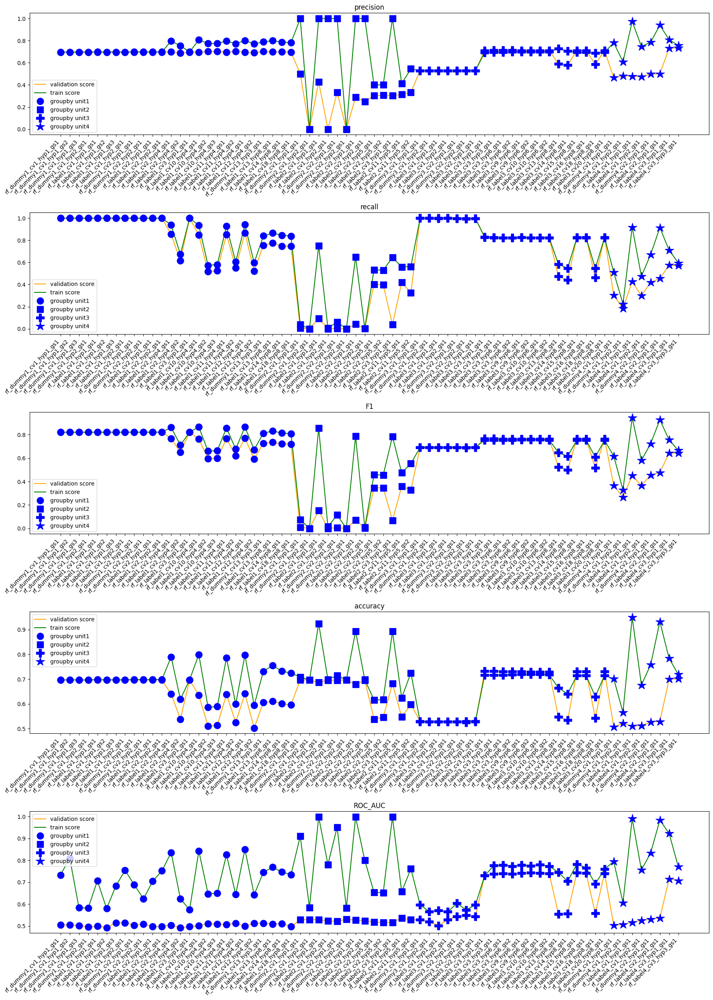

In [52]:
##############################################
#Show Validation Results
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(rf_val_score['model'], rf_val_score[metric], color='orange', label='validation score')
    ax.plot(rf_train_score['model'], rf_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"groupby unit{unit_index}")
        ax.plot(rf_train_score[rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout()
plt.show()

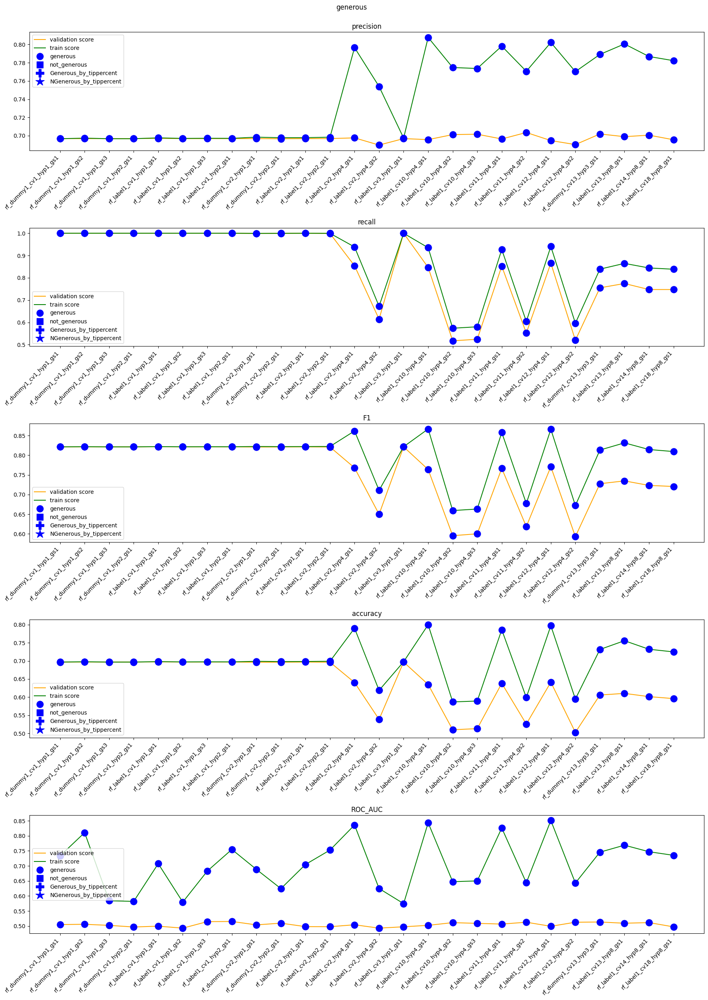

In [53]:
##############################################
#Show Validation Results
#generous(porportion of generous=1 is around 70%)
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=rf_val_score['model'].str.contains('label1|dummy1')
    mask_train=rf_train_score['model'].str.contains('label1|dummy1')
    ax.plot(rf_val_score[mask_val]['model'], rf_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(rf_train_score[mask_train]['model'], rf_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.suptitle('generous',y=1)
plt.tight_layout()
plt.show()
#we could observe traning f1 scores and validation f1 scores of some models(e.g. rf_dummy1_cv1_hyp1_gs1) were very close
#however their recall scores were close to 1, which indicate the models only predicted one class
#the model didn't work as a claasification model
#when used class_weight to adjust the weight of two classes, models began to predict other class
#we can observe valication scores decreased in some models, no big change in other models
#and all of the models the scores were not good, this indicate we lack of some important features
#ROC_AUC is around 50%, accuracy is under 70%(major class is 70%)
#very close to random guess, not recommend to use

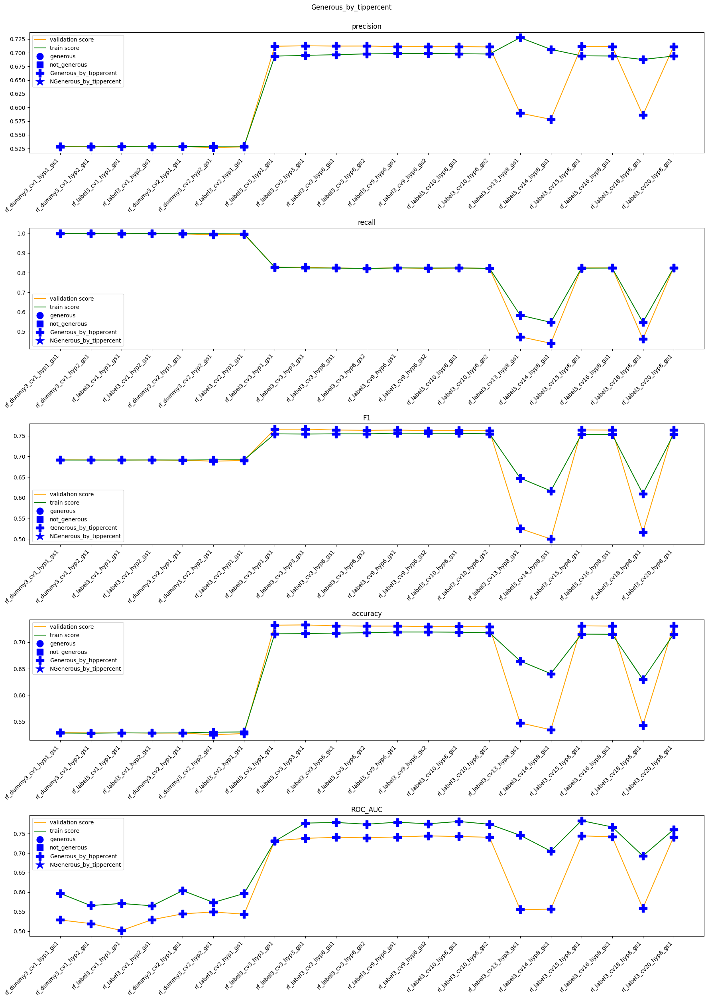

In [54]:
##############################################
#Show Validation Results
#Generous_by_tippercent
#(porportion of Generous_by_tippercent=1 is around 53%)
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=rf_val_score['model'].str.contains('label3|dummy3')
    mask_train=rf_train_score['model'].str.contains('label3|dummy3')
    ax.plot(rf_val_score[mask_val]['model'], rf_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(rf_train_score[mask_train]['model'], rf_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.suptitle('Generous_by_tippercent',y=1)
plt.tight_layout()
plt.show()

#we could observe when use 'VendorID' to predict, both f1 score and accuracy score increased
#'VendorID' seems to be an important features
#according to Analyze results, we know that these two vendors seems to have different way to round tip amount
#when use 'VendorID' to predict, recall of these models were not 1, precision were not 1, models predicted two classes
#when not use 'VendorID' to predict, recall of these models were close to 1

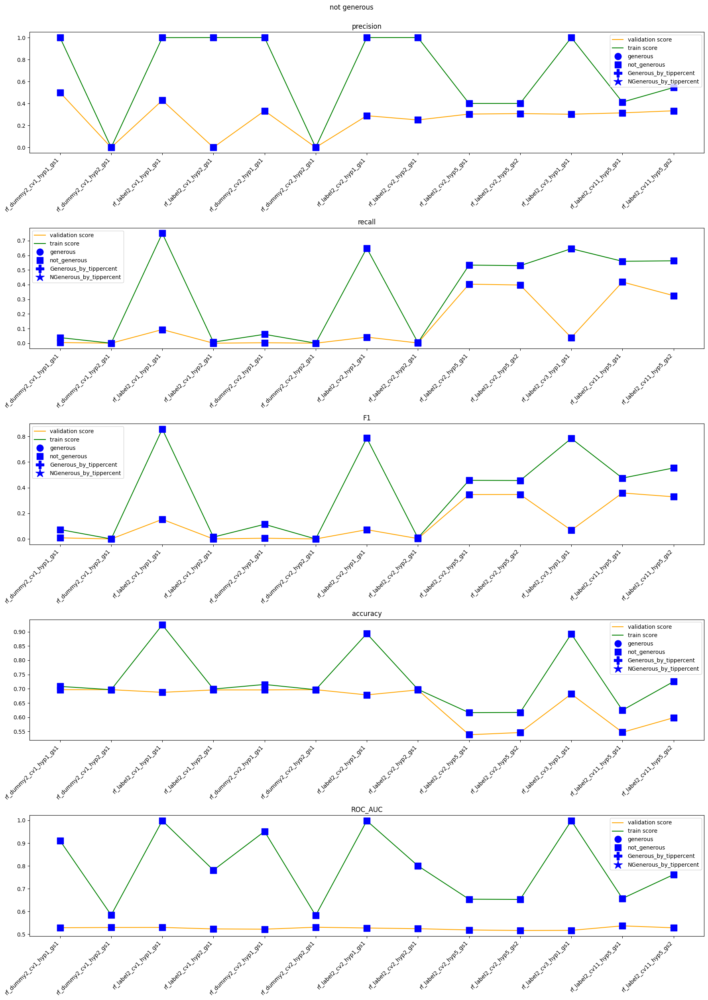

In [55]:
##############################################
#Show Validation Results
#not generous
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=rf_val_score['model'].str.contains('label2|dummy2')
    mask_train=rf_train_score['model'].str.contains('label2|dummy2')
    ax.plot(rf_val_score[mask_val]['model'], rf_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(rf_train_score[mask_train]['model'], rf_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.suptitle('not generous',y=1)
plt.tight_layout()
plt.show()

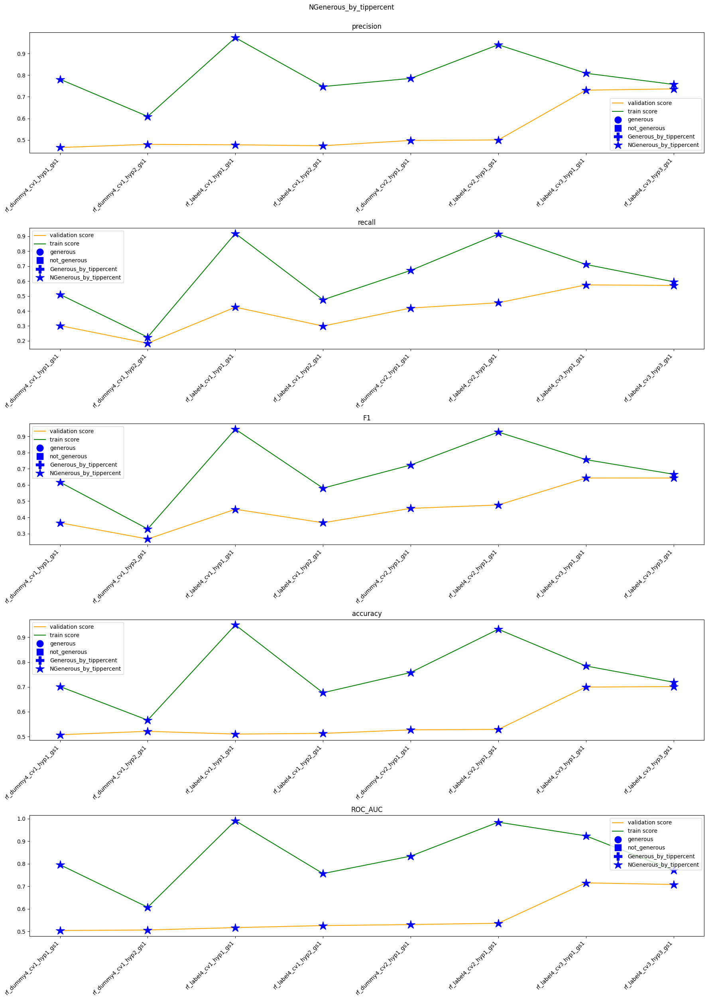

In [56]:
##############################################
#Show Validation Results
#NGenerous_by_tippercent
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=rf_val_score['model'].str.contains('label4|dummy4')
    mask_train=rf_train_score['model'].str.contains('label4|dummy4')
    ax.plot(rf_val_score[mask_val]['model'], rf_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(rf_train_score[mask_train]['model'], rf_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[mask_val&rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[mask_train&rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.suptitle('NGenerous_by_tippercent',y=1)
plt.tight_layout()
plt.show()

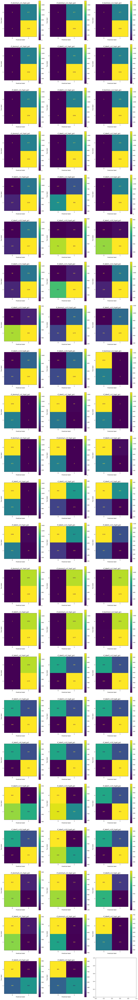

In [57]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(rf_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(rf_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])

plt.tight_layout()
plt.show()

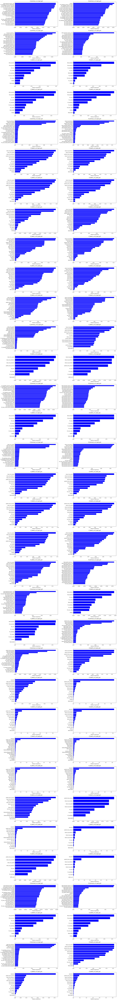

In [58]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    importances = rf_best.feature_importances_

    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=20:
        num_features = 20
    else:
        num_features =len(importances)

    ax.set_title(rf_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')

plt.tight_layout()
plt.show()

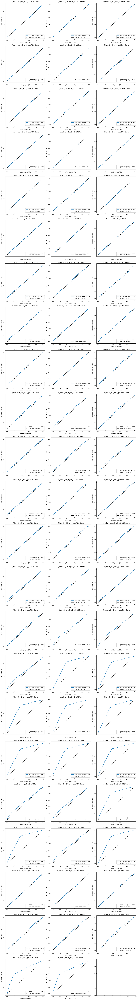

In [59]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

#for generous and not generous, ROC_AUC score were close to 0.5
#for Generous_by_tippercent and NGenerous_by_tippercent, when use 'VendorID'
#ROC_AUC score were close to 0.7

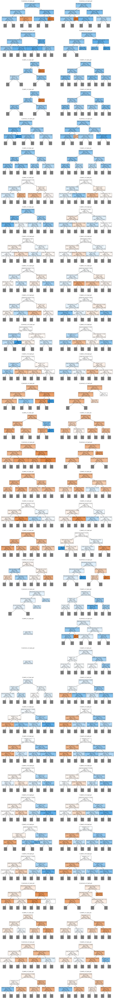

In [60]:
#############################################################
#Plot tree
#############################################################
from sklearn import tree

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    importances = rf_best.feature_importances_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')
    
    tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=2,
                   fontsize=10,
                   ax = ax)
        
    ax.set_title(rf_model_name_list[index])

plt.tight_layout()
plt.show()

### Fit model with train and validation set

* The best model I chose 
    * Consider tip_amount calculation difference: `rf_label1_cv14_hyp8_gs1`
    * Not Consider tip_amount calculation difference, Not use VendorID: `xgb_label3_cv14_hyp18_gs1`
    * Not Consider tip_amount calculation difference, use VendorID: `rf_label3_cv16_hyp8_gs1`

#### Fit train+validation set with best hyperpatameters
#### Get test score

In [61]:
#########################################################
#Best model
#Consider tip_amount calculation difference
#this type will choose random forest 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label1_cv14_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_dummy_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_dummy_test,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_label_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_label_test,rf_preds_proba)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='w')
rf_test_score

best hyperpatameters: {'class_weight': 'balanced_subsample', 'max_depth': 9, 'max_features': 0.9, 'max_samples': 0.3, 'min_samples_leaf': 0.001, 'min_samples_split': 2, 'n_estimators': 180, 'RF Model name': 'rf_label1_cv14_hyp8_gs1'}
best features: ['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: rf_label1_cv14_hyp8_gs1


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_label1_cv14_hyp8_gs1,0.706255,0.731867,0.718833,0.601182,0.521098


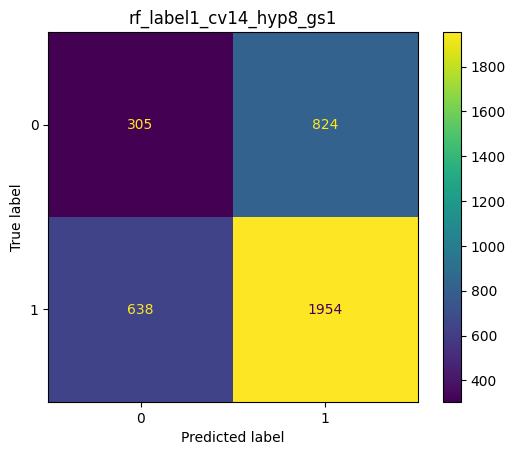

In [62]:
################################################
#Display confusion matrix of champion model
################################################
confusion_matrix_plot(best_rf, 
                      X_label_test[select_feature], 
                      y_label_test, 
                      title=best_model_name)

In [63]:
%%script True
#########################################################
#Good model
#Not Consider tip_amount calculation difference
#if we could not use VendorID
#this type will choose xgb
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label3_cv18_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_dummy_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_dummy_test,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_label_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_label_test,rf_preds_proba)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='a')
rf_test_score


Couldn't find program: 'True'


In [64]:
#########################################################
#Best model
#Not Consider tip_amount calculation difference
#if we could use VendorID
#this type will choose random forest 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label3_cv16_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_dummy_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_dummy_test,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_label_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_label_test,rf_preds_proba)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='a')
rf_test_score

best hyperpatameters: {'class_weight': 'balanced', 'max_depth': 7, 'max_features': 0.9, 'max_samples': 0.7, 'min_samples_leaf': 0.01, 'min_samples_split': 2, 'n_estimators': 80, 'RF Model name': 'rf_label3_cv16_hyp8_gs1'}
best features: ['RatecodeID', 'VendorID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: rf_label3_cv16_hyp8_gs1


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_label3_cv16_hyp8_gs1,0.683876,0.821974,0.746593,0.705187,0.71517


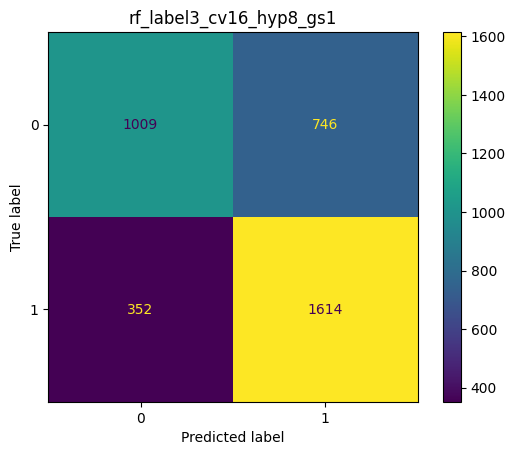

In [65]:
################################################
#Display confusion matrix of champion model
################################################
confusion_matrix_plot(best_rf, 
                      X_label_test[select_feature], 
                      y_label_test, 
                      title=best_model_name)

In [66]:
###################################################
#Just see all models
###################################################
rf_all_test_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_params=rf_cv.best_params_
    if 'RF Model name' in rf_params:
        rf_params.pop('RF Model name')
    rf_classifier = RandomForestClassifier(**rf_params,
                                          random_state=RANDOM_STATE)
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        rf_classifier.fit(X_dummy_train_val[select_feature], y_dummy_train_val)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        rf_preds=rf_classifier.predict(X_dummy_test[select_feature])
        rf_preds_proba=rf_classifier.predict_proba(X_dummy_test[select_feature])[:, 1]
        test_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_test,rf_preds_proba)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        rf_classifier.fit(X_label_train_val[select_feature], y_label_train_val)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        rf_preds=rf_classifier.predict(X_label_test[select_feature])
        rf_preds_proba=rf_classifier.predict_proba(X_label_test[select_feature])[:, 1]
        test_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_test,rf_preds_proba)
    
    rf_all_test_score_list.append(test_score)

rf_all_test_score=pd.concat(rf_all_test_score_list).reset_index(drop=True)
rf_all_test_score.to_csv('rf_all_test_score.csv', index=False)
rf_all_test_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696587,1.000000,0.821163,0.696587,0.541453
1,rf_dummy1_cv1_hyp1_gs2,0.696741,0.998071,0.820619,0.696049,0.523469
2,rf_dummy1_cv1_hyp1_gs3,0.696587,1.000000,0.821163,0.696587,0.525175
3,rf_dummy1_cv1_hyp2_gs1,0.696587,1.000000,0.821163,0.696587,0.524506
4,rf_label1_cv1_hyp1_gs1,0.696880,0.999614,0.821236,0.696856,0.520607
...,...,...,...,...,...,...
63,rf_label4_cv1_hyp2_gs1,0.510436,0.306553,0.383054,0.534265,0.538220
64,rf_dummy4_cv2_hyp1_gs1,0.508133,0.373789,0.430729,0.533996,0.548297
65,rf_label4_cv2_hyp1_gs1,0.498074,0.442165,0.468458,0.526740,0.535205
66,rf_label4_cv3_hyp1_gs1,0.732694,0.609117,0.665215,0.710830,0.725862


In [67]:
#Confirm test scores of generous
#Consider tip amount calculation difference between two vendors
rf_all_test_score[rf_all_test_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.696587,1.000000,0.821163,0.696587,0.541453
1,rf_dummy1_cv1_hyp1_gs2,0.696741,0.998071,0.820619,0.696049,0.523469
2,rf_dummy1_cv1_hyp1_gs3,0.696587,1.000000,0.821163,0.696587,0.525175
3,rf_dummy1_cv1_hyp2_gs1,0.696587,1.000000,0.821163,0.696587,0.524506
4,rf_label1_cv1_hyp1_gs1,0.696880,0.999614,0.821236,0.696856,0.520607
5,rf_label1_cv1_hyp1_gs2,0.696904,0.998843,0.820993,0.696587,0.516082
6,rf_label1_cv1_hyp1_gs3,0.696693,0.999614,0.821106,0.696587,0.522628
7,rf_label1_cv1_hyp2_gs1,0.696693,0.999614,0.821106,0.696587,0.524496
8,rf_dummy1_cv2_hyp1_gs1,0.696587,1.000000,0.821163,0.696587,0.533951
9,rf_dummy1_cv2_hyp2_gs1,0.696390,0.997299,0.820114,0.695243,0.535921


In [68]:
#Confirm test scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
rf_all_test_score[rf_all_test_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC
39,rf_dummy3_cv1_hyp1_gs1,0.528353,1.000000,0.691401,0.528353,0.539376
40,rf_dummy3_cv1_hyp2_gs1,0.527972,0.998474,0.690711,0.527546,0.527887
41,rf_label3_cv1_hyp1_gs1,0.528353,1.000000,0.691401,0.528353,0.525241
42,rf_label3_cv1_hyp2_gs1,0.528353,1.000000,0.691401,0.528353,0.527833
43,rf_dummy3_cv2_hyp1_gs1,0.528353,1.000000,0.691401,0.528353,0.557625
44,rf_dummy3_cv2_hyp2_gs1,0.528047,0.995931,0.690166,0.527546,0.545178
45,rf_label3_cv2_hyp1_gs1,0.528495,1.000000,0.691523,0.528621,0.554937
46,rf_label3_cv3_hyp1_gs1,0.682660,0.825025,0.747121,0.704918,0.711608
47,rf_label3_cv3_hyp3_gs1,0.683496,0.819430,0.745316,0.704112,0.717954
48,rf_label3_cv3_hyp6_gs1,0.683630,0.819939,0.745606,0.704381,0.721428


### Fit model with all data

#### Fit whole set(clean data) with best hyperpatameters
#### Predict whole set

In [69]:
#########################################################
#Best model
#Consider tip_amount calculation difference
#this type will choose random forest 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label1_cv14_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_
#**best_rf.best_params_
best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_dummy[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_dummy,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_label[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_label,rf_preds_proba)

rf_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
rf_wholeset_score.to_csv('rf_wholeset_score.csv', index=False, mode='w')
rf_wholeset_score

best hyperpatameters: {'class_weight': 'balanced_subsample', 'max_depth': 9, 'max_features': 0.9, 'max_samples': 0.3, 'min_samples_leaf': 0.001, 'min_samples_split': 2, 'n_estimators': 180}
best features: ['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: rf_label1_cv14_hyp8_gs1


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_label1_cv14_hyp8_gs1,0.771273,0.804224,0.787404,0.69744,0.700252


In [70]:
%%script True
#########################################################
#Good model
#Not Consider tip_amount calculation difference
#if we could not use VendorID
#this type will choose XGB boost 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label3_cv18_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_

#**best_rf.best_params_
best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_dummy[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_dummy,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_label[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_label,rf_preds_proba)

rf_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
rf_wholeset_score.to_csv('rf_wholeset_score.csv', index=False, mode='a')
rf_wholeset_score

Couldn't find program: 'True'


In [71]:
#########################################################
#Best model
#Not Consider tip_amount calculation difference
#if we could use VendorID
#this type will choose random forest 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label3_cv16_hyp8_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_

#**best_rf.best_params_
best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_dummy[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_dummy,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(rf_model_name_list[best_model_index], 'rf_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    rf_preds=rf_classifier_best.predict(X_label[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, rf_preds, y_label,rf_preds_proba)

rf_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
rf_wholeset_score.to_csv('rf_wholeset_score.csv', index=False, mode='a')
rf_wholeset_score

best hyperpatameters: {'class_weight': 'balanced', 'max_depth': 7, 'max_features': 0.9, 'max_samples': 0.7, 'min_samples_leaf': 0.01, 'min_samples_split': 2, 'n_estimators': 80}
best features: ['RatecodeID', 'VendorID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: rf_label3_cv16_hyp8_gs1


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_label3_cv16_hyp8_gs1,0.693597,0.826634,0.754294,0.715514,0.754994


### **Conclusion**

* Consider tip_amount calculation difference:
    * Champion model:`rf_label1_cv14_hyp8_gs1`
    * Model features: `RatecodeID`,`mean_trip_distance`, `mean_trip_duration`, `mean_trip_speed`,
       `predict_fare_amount`, `PU_month`, `PU_weekday`,`PU_hour`
    * Lack of important features, the model score was not good. `mean_trip_speed`, `mean_trip_distance`, `mean_trip_duration`,`predict_fare_amount` were relatively important features
    * Limitation:
        * Could only predict credit card trips
    * Model assumptions:
        * Two vendors only had two way to calculate tip_amount, round tip_amount to .01 or round down to .05.
    * Model score:

|score|precision|recall   |F1      |accuracy|ROC_AUC |
|:-   |:-       |:-       |:-      |:-      |:-      |
|train|0.786816 |0.844237 |0.814516|0.732109|0.747175|
|val  |0.700602 |0.747429 |0.723259|0.601433|0.511623|
|test |0.706255 |0.731867 |0.718833|0.601182|0.521098|

* Not Consider tip_amount calculation difference, use VendorID:
    * Champion model:`rf_label3_cv16_hyp8_gs1`
    * Model features: `RatecodeID`,`VendorID`,
       `mean_trip_distance`, `mean_trip_duration`, `mean_trip_speed`,
       `predict_fare_amount`, `PU_month`, `PU_weekday`,`PU_hour`
    * `VendorID` was the most important feature
    * Limitation:
        * Could only predict credit card trips
    * Model assumptions:
        * Two vendors had the same way to calculate tip_amount
        * Tip_percent which calculated from tip_amount could reflect the actual choice of passengers
    * Model score:

|score|precision|recall   |F1      |accuracy|ROC_AUC |
|:-   |:-       |:-       |:-      |:-      |:-      |
|train|0.693943 |0.823579 |0.753224|0.714974|0.766781|
|val  |0.711257 |0.824576 |0.763736|0.730408|0.741567|
|test |0.683876 |0.821974 |0.746593|0.705187|0.71517 |

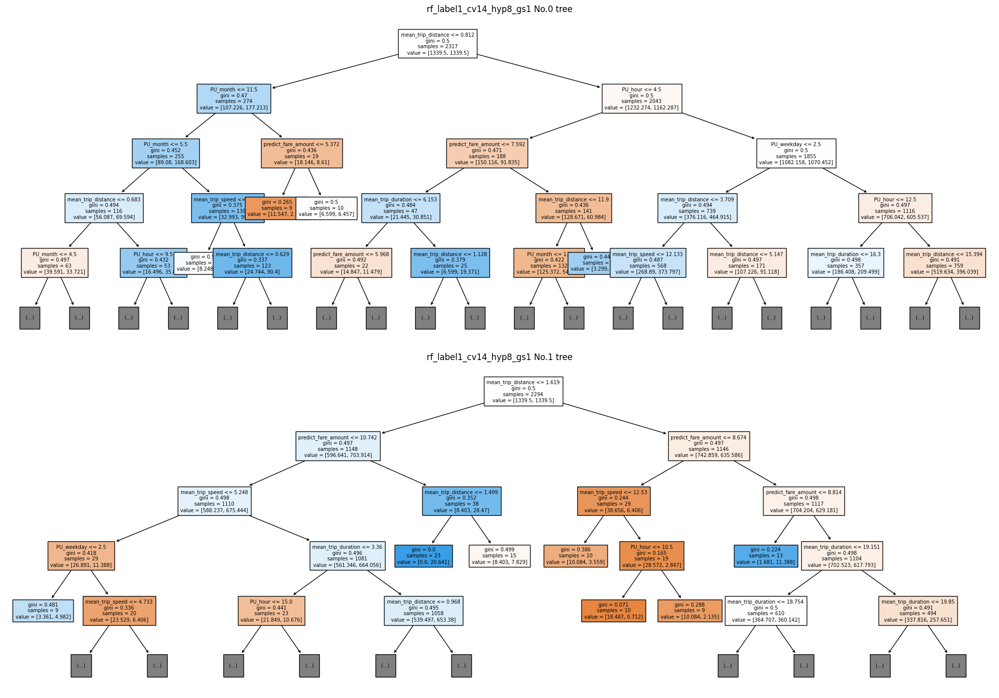

In [72]:
#############################################################
#Plot tree of champion model
#rf_label1_cv14_hyp8_gs1
#############################################################
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,14))

champion_model_name='rf_label1_cv14_hyp8_gs1'
best_model_index=rf_model_name_list.index(champion_model_name)
#best_rf=rf_cv_list[best_model_index]
rf_best=rf_cv_list[best_model_index].best_estimator_

importances = rf_best.feature_importances_

params_index=find_number(champion_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

if '_dummy' in champion_model_name:
    features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
elif '_label' in champion_model_name:
     features=get_fit_features(select_col,X_label_val.columns,'label')

#plot the first tree
tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[0])
axes[0].set_title(f'{champion_model_name} No.0 tree')

#plot the second tree
tree.plot_tree(rf_best.estimators_[1],
                   feature_names = features, 
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[1])
        
axes[1].set_title(f'{champion_model_name} No.1 tree')

plt.tight_layout()
plt.show()

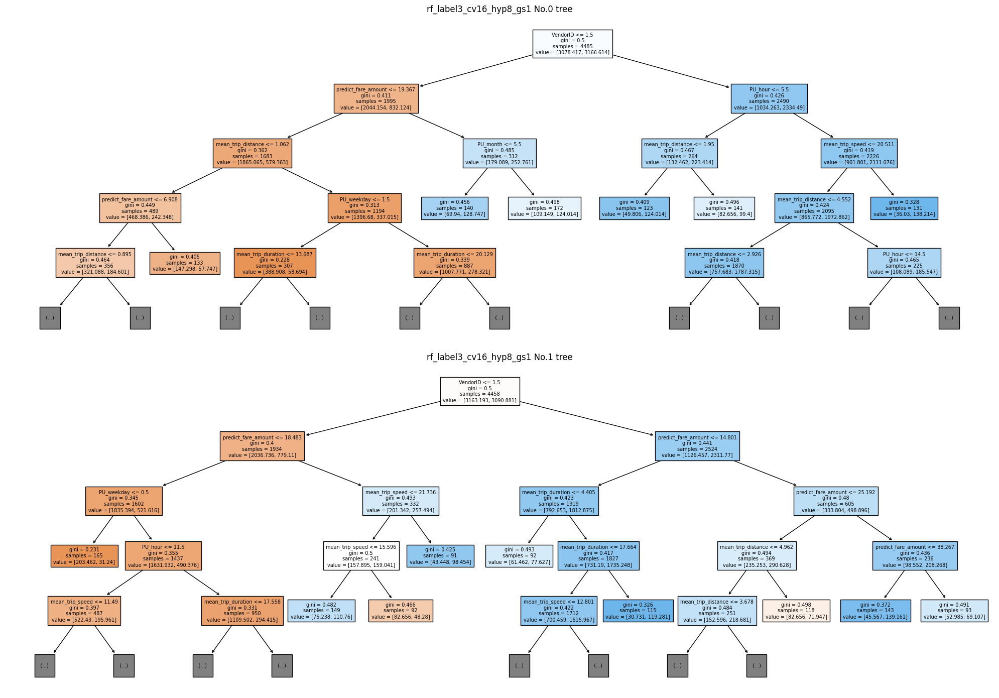

In [73]:
#############################################################
#Plot tree of champion model
#rf_label3_cv16_hyp8_gs1
#############################################################
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,14))

champion_model_name='rf_label3_cv16_hyp8_gs1'
best_model_index=rf_model_name_list.index(champion_model_name)
#best_rf=rf_cv_list[best_model_index]
rf_best=rf_cv_list[best_model_index].best_estimator_

importances = rf_best.feature_importances_

params_index=find_number(champion_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

if '_dummy' in champion_model_name:
    features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
elif '_label' in champion_model_name:
     features=get_fit_features(select_col,X_label_val.columns,'label')

#plot the first tree
tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[0])
axes[0].set_title(f'{champion_model_name} No.0 tree')

#plot the second tree
tree.plot_tree(rf_best.estimators_[1],
                   feature_names = features, 
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[1])
        
axes[1].set_title(f'{champion_model_name} No.1 tree')

plt.tight_layout()
plt.show()